In [21]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.image import imread


In [25]:
def display_series_images(series_id, df, image_path=r'D:\Similar Images\automatic_triage_photo_series\train_val\train_val_imgs'):
    series_data = df[df['series_id'] == series_id].copy()
    
    if series_data.empty:
        print(f"No data found for series_id: {series_id}")
        return
    
    n_rows = len(series_data)
    fig, axes = plt.subplots(n_rows, 2, figsize=(12, 6 * n_rows))
    
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    
    for idx, row in series_data.iterrows():
        img1_path = os.path.join(image_path, row['image1'])
        img2_path = os.path.join(image_path, row['image2'])
        
        img1 = imread(img1_path)
        img2 = imread(img2_path)
        
        row_idx = series_data.index.get_loc(idx)
        
        axes[row_idx, 0].imshow(img1)
        axes[row_idx, 0].axis('off')
        axes[row_idx, 1].imshow(img2)
        axes[row_idx, 1].axis('off')
        
        winner_label = f"Winner: {row['winner']}"
        pred_label = f"Pred: {row['pred']}"
        is_correct = row['winner'] == row['pred']
        
        title_color = 'green' if is_correct else 'red'
        title = f"{winner_label} | {pred_label}"
        
        axes[row_idx, 0].set_title(f"{row['image1']}\n{title}", color=title_color, fontweight='bold')
        axes[row_idx, 1].set_title(f"{row['image2']}\n{title}", color=title_color, fontweight='bold')
    
    plt.tight_layout()
    plt.show()


In [2]:
df0 = pd.read_csv(r'D:\sim-bench\outputs\siamese_e2e\20251215_015427\epoch_000\val\metrics\eval_dump.csv')

In [5]:
df0.head()

,image1,image2,winner,pred,logp0,logp1,p0,p1,agreement,num_reviewers,series_id,Success
0,000012-01.JPG,000012-02.JPG,1,0,0.000000,-17.493372,1.000000e+00,2.527698e-08,0.750000,4,12,0
1,000012-02.JPG,000012-01.JPG,0,1,-17.387327,0.000000,2.810475e-08,1.000000e+00,1.000000,7,12,0
2,000014-01.JPG,000014-02.JPG,1,0,-0.530782,-0.887084,5.881449e-01,4.118552e-01,1.000000,3,14,0
3,000014-02.JPG,000014-01.JPG,0,1,-0.826079,-0.575831,4.377624e-01,5.622376e-01,0.833333,6,14,0
4,000050-02.JPG,000050-01.JPG,0,1,-3.589182,-0.028010,2.762090e-02,9.723791e-01,1.000000,4,50,0


In [6]:
df0['Success'] = (df0['winner'] == df0['pred']).astype(int)

In [13]:
df_success_mean = df0.groupby(['series_id']).agg(
    Success=('Success', 'mean'),
    count=('Success', 'count')
).reset_index()

In [11]:
df0['Success'].mean()

0.485

In [17]:
df0.query("series_id==391")

,image1,image2,winner,pred,logp0,logp1,p0,p1,agreement,num_reviewers,series_id,Success
87,000391-01.JPG,000391-02.JPG,0,1,-8.764916,-0.000156,0.000156,0.999844,1.000000,3,391,0
88,000391-01.JPG,000391-03.JPG,0,1,-10.603870,-0.000025,0.000025,0.999975,1.000000,2,391,0
89,000391-01.JPG,000391-04.JPG,0,1,-11.186059,-0.000014,0.000014,0.999986,0.750000,4,391,0
90,000391-02.JPG,000391-01.JPG,1,0,-0.000140,-8.870934,0.999860,0.000140,1.000000,2,391,0
91,000391-02.JPG,000391-05.JPG,1,1,-1.179472,-0.367362,0.307441,0.692559,1.000000,2,391,1
92,000391-03.JPG,000391-02.JPG,0,0,-0.140416,-2.032530,0.868996,0.131004,0.833333,6,391,1
93,000391-03.JPG,000391-05.JPG,0,0,-0.306078,-1.333053,0.736329,0.263671,1.000000,2,391,1
94,000391-04.JPG,000391-01.JPG,1,0,-0.000013,-11.292107,0.999987,0.000012,1.000000,2,391,0
95,000391-04.JPG,000391-05.JPG,0,0,-0.182366,-1.791539,0.833297,0.166703,1.000000,2,391,1
96,000391-05.JPG,000391-01.JPG,1,0,-0.000059,-9.735992,0.999941,0.000059,1.000000,5,391,0


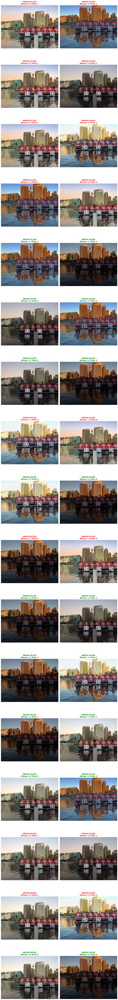

In [26]:
display_series_images(391, df0, image_path=r'D:\Similar Images\automatic_triage_photo_series\train_val\train_val_imgs')


In [16]:
df_success_mean.sort_values(by='count', ascending=False).head(20)

,series_id,Success,count
26,391,0.529412,17
23,352,0.666667,12
29,481,0.750000,12
25,367,0.636364,11
21,341,0.363636,11
42,606,0.333333,9
13,182,0.142857,7
33,522,0.428571,7
34,524,0.714286,7
39,566,0.333333,6


In [ ]:
display_series_images

<Axes: xlabel='Success', ylabel='Count'>

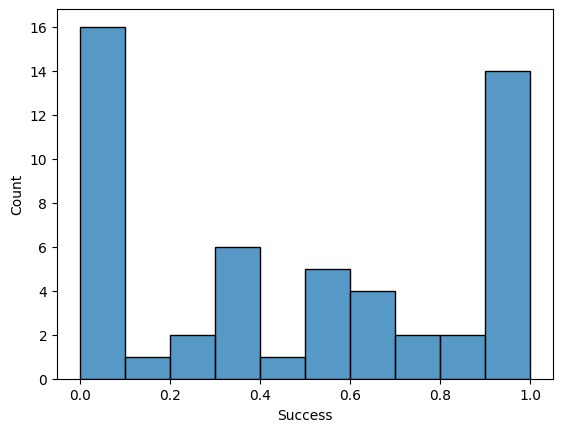

In [10]:
sns.histplot(df_success_mean, x='Success', bins=10)